In [ ]:
# Faster-RCNN implementation based on Detectron2

# TODO & NEXT STEPS: Data augmentation; mask-based Mask-RCNN; ....

In [36]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


In [35]:
import torch
print(torch.__version__)

1.12.1+cu113


In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [ ]:
exit(0) #shut and restart

In [3]:
!nvidia-smi

Mon Sep 19 04:03:09 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [5]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from tqdm import tqdm

import shutil
import os

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.visualizer import ColorMode

In [21]:
!wget https://raw.githubusercontent.com/pedropro/TACO/master/data/annotations.json
!rm -rf ./yoloTACO
!rm -rf ./tronTACO
!rm -rf ./output/
!rm -rf ./content

if not os.path.isfile('./rotated2.zip'):
    !gdown 1X3O2v3GIPveq3ylWF6o1qHI5uzbN1vWA
!unzip -qq rotated2.zip
%mv ./content/* ./
%rm -rf ./content
%mv ./yoloTACO ./tronTACO

In [8]:
%%capture
anns_path = '/content/annotations.json'
coco = COCO(annotation_file=anns_path)
  
def anno_getter(img_id):
  annotation_ids = coco.getAnnIds(img_id)
  annotations = coco.loadAnns(annotation_ids)
  temp=[]
  for annotation in annotations:
    label = annotation['category_id']
    box = annotation['bbox']
    # exclude some annotations that's too small
    # as in yolo models
    if box[2] < 10 or box[3] < 10:
      continue
    temp.append([label]+box)
  return temp

img_size_list=[]
for id in range(1500):  # Load image
  I = Image.open('tronTACO/images/'+str(id)+'.jpg')
  w,h= I.size
  img_size_list.append([id,w,h])

In [9]:
# minimum annotations per image
np.min([len(anno_getter(i)) for i in range(1500)])

1

In [10]:
%%capture
## train test split

import random
id_list=[i for i in range(1500)]
random.shuffle(id_list)

train_ids = id_list[:1050]
val_ids = id_list[1050:1050+300]
test_ids = id_list[1050+300:]

def move_helper(ids, desti):
  for id in ids:
    img_name = os.path.join( './tronTACO/images', str(id)+'.jpg' )
    lbl_name = os.path.join( './tronTACO/labels', str(id)+'.txt' )
    print(img_name)
    if os.path.isfile(img_name):
        shutil.move( img_name, './tronTACO/images/'+desti)
        shutil.move( lbl_name, './tronTACO/labels/'+desti)
    else :
        print('file does not exist', img_name)

!mkdir tronTACO/images/train
!mkdir tronTACO/images/val
!mkdir tronTACO/images/test
!mkdir tronTACO/labels/train
!mkdir tronTACO/labels/val
!mkdir tronTACO/labels/test
move_helper(test_ids,'test')
move_helper(train_ids,'train')
move_helper(val_ids,'val')

In [11]:
from detectron2.structures import BoxMode

def annotation_reader(id):
  list_dict_=[]
  annotations_for_id = anno_getter(id)
  for i in annotations_for_id:
    temp_dict={
        'bbox': i[1:],
        'bbox_mode':BoxMode.XYWH_ABS,
        'category_id':i[0]}
    list_dict_.append(temp_dict)
  return list_dict_
  
def my_dataset_function(flag):
  train_ids = id_list[:1050]
  val_ids = id_list[1050:1050+300]
  test_ids = id_list[1050+300:]

  if flag=='train':range_=train_ids
  elif flag=='val':range_=val_ids
  elif flag=='test':range_=test_ids
  else: print('Error')
  
  list_dict=[]
  for i in range_:
    temp_dict={'file_name' : 'tronTACO/images/'+flag+'/'+str(i)+'.jpg',
               'height' : img_size_list[i][2],
               'width' : img_size_list[i][1],
               'image_id' : img_size_list[i][0],
               'annotations' : annotation_reader(i)
               }
    list_dict.append(temp_dict)  
  return list_dict

In [13]:
from detectron2.data import DatasetCatalog
# clean the registry
DatasetCatalog.clear()
# register ours
for d in ["train", "val","test"]:
    DatasetCatalog.register("tronTACO_" + d, lambda d=d: my_dataset_function(d))

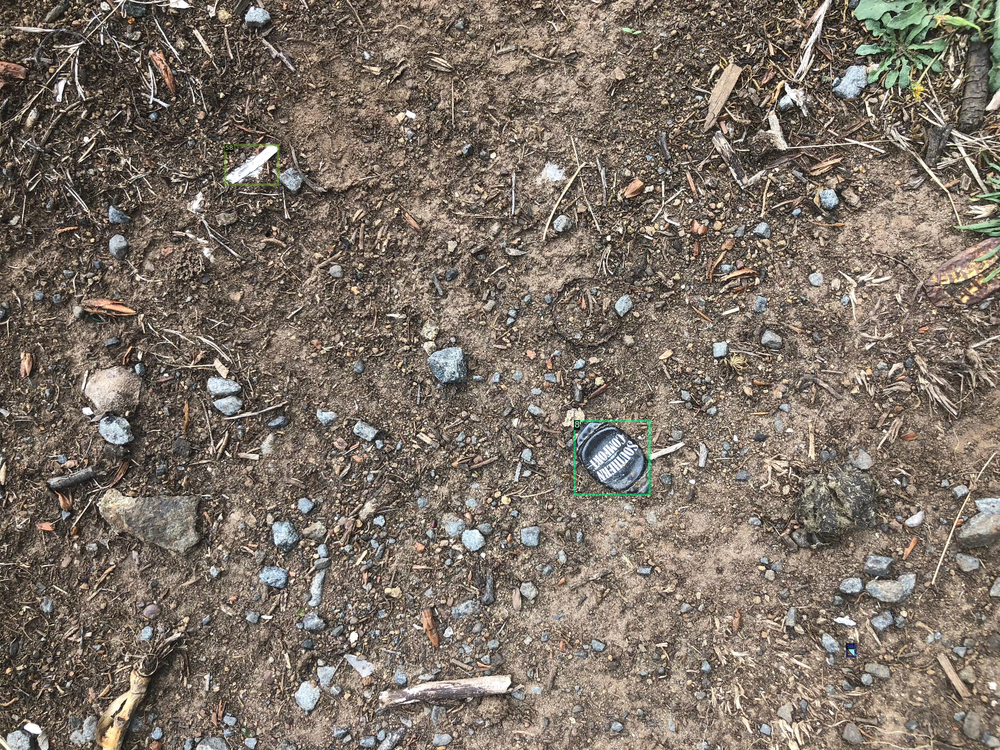

In [14]:
# visual check; if image and bbox are correct
dataset_dicts = my_dataset_function('test')
d=dataset_dicts[1]
img = cv2.imread(d["file_name"])
visualizer = Visualizer(img[:, :, ::-1], scale=0.5)
out = visualizer.draw_dataset_dict(d)
cv2_imshow(out.get_image()[:, :, ::-1])

In [15]:
torch.cuda.empty_cache()

In [17]:
# Example: Transfer learning with a Faster_RCNN_ResNeXt-101-32x8d

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("tronTACO_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml") 
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0025 
cfg.SOLVER.MAX_ITER = 500 
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 60 

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[09/19 04:07:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[09/19 04:07:10 d2.engine.train_loop]: Starting training from iteration 0
[09/19 04:08:07 d2.utils.events]:  eta: 0:22:37  iter: 19  total_loss: 4.875  loss_cls: 3.905  loss_box_reg: 0.6365  loss_rpn_cls: 0.3265  loss_rpn_loc: 0.08104  time: 2.7858  data_time: 0.2284  lr: 9.7405e-05  max_mem: 11269M
[09/19 04:09:03 d2.utils.events]:  eta: 0:21:43  iter: 39  total_loss: 2.052  loss_cls: 1.223  loss_box_reg: 0.4724  loss_rpn_cls: 0.05861  loss_rpn_loc: 0.02391  time: 2.7950  data_time: 0.1916  lr: 0.00019731  max_mem: 11269M
[09/19 04:10:00 d2.utils.events]:  eta: 0:20:45  iter: 59  total_loss: 1.291  loss_cls: 0.7532  loss_box_reg: 0.4082  loss_rpn_cls: 0.07113  loss_rpn_loc: 0.03971  time: 2.8011  data_time: 0.2315  lr: 0.0002972  max_mem: 11269M
[09/19 04:10:56 d2.utils.events]:  eta: 0:19:47  iter: 79  total_loss: 1.603  loss_cls: 0.924  loss_box_reg: 0.5804  loss_rpn_cls: 0.06012  loss_rpn_loc: 0.01748  time: 2.8070  data_time: 0.1278  lr: 0.00039711  max_mem: 11269M
[09/19 04:11:55

In [32]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2   # custom testing threshold
predictor = DefaultPredictor(cfg)

[09/19 04:36:49 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,8,3,3)         |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

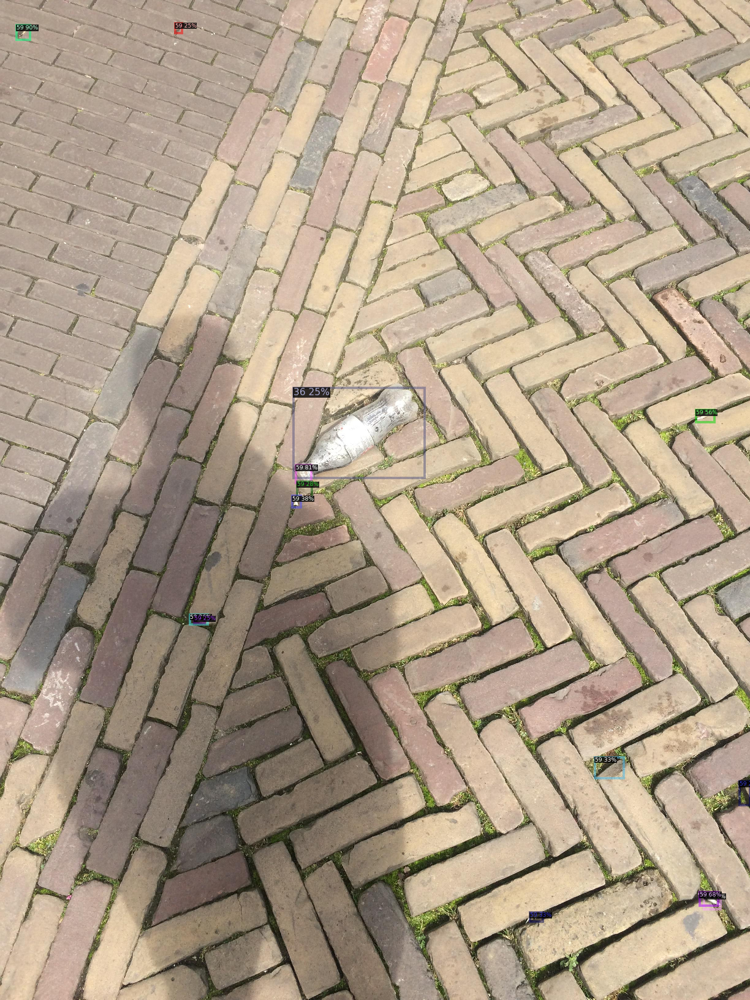

In [34]:
# visualize random predictions on test set
dataset_dicts = my_dataset_function("test")
for d in random.sample(dataset_dicts, 1):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im) 
    v = Visualizer(im[:, :, ::-1],
                   scale=0.5)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])